# Clustering of credit card customers

In [108]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [109]:
df=pd.read_csv('Credit_card_details.csv')
df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


## EDA

In [110]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [111]:
df.describe(percentiles=(0.01,0.1,0.25,0.5,0.75,0.9,0.99)).T

,count,mean,std,min,1%,10%,25%,50%,75%,90%,99%,max
BALANCE,8950.0,1564.474828,2081.531879,0.000000,0.065101,23.575529,128.281915,873.385231,2054.140036,4338.563657,9338.804814,19043.13856
BALANCE_FREQUENCY,8950.0,0.877271,0.236904,0.000000,0.090909,0.454545,0.888889,1.000000,1.000000,1.000000,1.000000,1.00000
PURCHASES,8950.0,1003.204834,2136.634782,0.000000,0.000000,0.000000,39.635000,361.280000,1110.130000,2542.624000,8977.290000,49039.57000
ONEOFF_PURCHASES,8950.0,592.437371,1659.887917,0.000000,0.000000,0.000000,0.000000,38.000000,577.405000,1600.099000,6689.898200,40761.25000
INSTALLMENTS_PURCHASES,8950.0,411.067645,904.338115,0.000000,0.000000,0.000000,0.000000,89.000000,468.637500,1140.070000,3886.240500,22500.00000
CASH_ADVANCE,8950.0,978.871112,2097.163877,0.000000,0.000000,0.000000,0.000000,0.000000,1113.821139,3065.534560,9588.163357,47137.21176
PURCHASES_FREQUENCY,8950.0,0.490351,0.401371,0.000000,0.000000,0.000000,0.083333,0.500000,0.916667,1.000000,1.000000,1.00000
ONEOFF_PURCHASES_FREQUENCY,8950.0,0.202458,0.298336,0.000000,0.000000,0.000000,0.000000,0.083333,0.300000,0.750000,1.000000,1.00000
PURCHASES_INSTALLMENTS_FREQUENCY,8950.0,0.364437,0.397448,0.000000,0.000000,0.000000,0.000000,0.166667,0.750000,1.000000,1.000000,1.00000
CASH_ADVANCE_FREQUENCY,8950.0,0.135144,0.200121,0.000000,0.000000,0.000000,0.000000,0.000000,0.222222,0.416667,0.833333,1.50000


### Missing value calculations

In [112]:
pd.DataFrame({'Missing values':df.isnull().sum(),'% of missing values':round(df.isnull().sum()/df.shape[0]*100,2)})

,Missing values,% of missing values
CUST_ID,0,0.00
BALANCE,0,0.00
BALANCE_FREQUENCY,0,0.00
PURCHASES,0,0.00
ONEOFF_PURCHASES,0,0.00
INSTALLMENTS_PURCHASES,0,0.00
CASH_ADVANCE,0,0.00
PURCHASES_FREQUENCY,0,0.00
ONEOFF_PURCHASES_FREQUENCY,0,0.00
PURCHASES_INSTALLMENTS_FREQUENCY,0,0.00


CREDIT_LIMIT and MINIMUM_PAYMENTS have missing values.   
Missing values are replaced by respective median values.

### Missing value imputations

In [113]:
df[df['CREDIT_LIMIT'].isnull()]=df['CREDIT_LIMIT'].median()
df[df['MINIMUM_PAYMENTS'].isnull()]=df['MINIMUM_PAYMENTS'].median()

In [114]:
pd.DataFrame({'Missing values':df.isnull().sum(),'% of missing values':round(df.isnull().sum()/df.shape[0]*100,2)})

,Missing values,% of missing values
CUST_ID,0,0.0
BALANCE,0,0.0
BALANCE_FREQUENCY,0,0.0
PURCHASES,0,0.0
ONEOFF_PURCHASES,0,0.0
INSTALLMENTS_PURCHASES,0,0.0
CASH_ADVANCE,0,0.0
PURCHASES_FREQUENCY,0,0.0
ONEOFF_PURCHASES_FREQUENCY,0,0.0
PURCHASES_INSTALLMENTS_FREQUENCY,0,0.0


Dropping redundant feature CUST_ID

In [115]:
df=df.drop(['CUST_ID'],axis=1)
df.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.400000,0.000000,95.400000,0.000000,0.166667,0.000000,0.083333,0.000000,0.000000,2.000000,1000.000000,201.802084,139.509787,0.000000,12.000000
1,3202.467416,0.909091,0.000000,0.000000,0.000000,6442.945483,0.000000,0.000000,0.000000,0.250000,4.000000,0.000000,7000.000000,4103.032597,1072.340217,0.222222,12.000000
2,2495.148862,1.000000,773.170000,773.170000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,12.000000,7500.000000,622.066742,627.284787,0.000000,12.000000
3,312.560636,312.560636,312.560636,312.560636,312.560636,312.560636,312.560636,312.560636,312.560636,312.560636,312.560636,312.560636,312.560636,312.560636,312.560636,312.560636,312.560636
4,817.714335,1.000000,16.000000,16.000000,0.000000,0.000000,0.083333,0.083333,0.000000,0.000000,0.000000,1.000000,1200.000000,678.334763,244.791237,0.000000,12.000000


### Distribution plots 

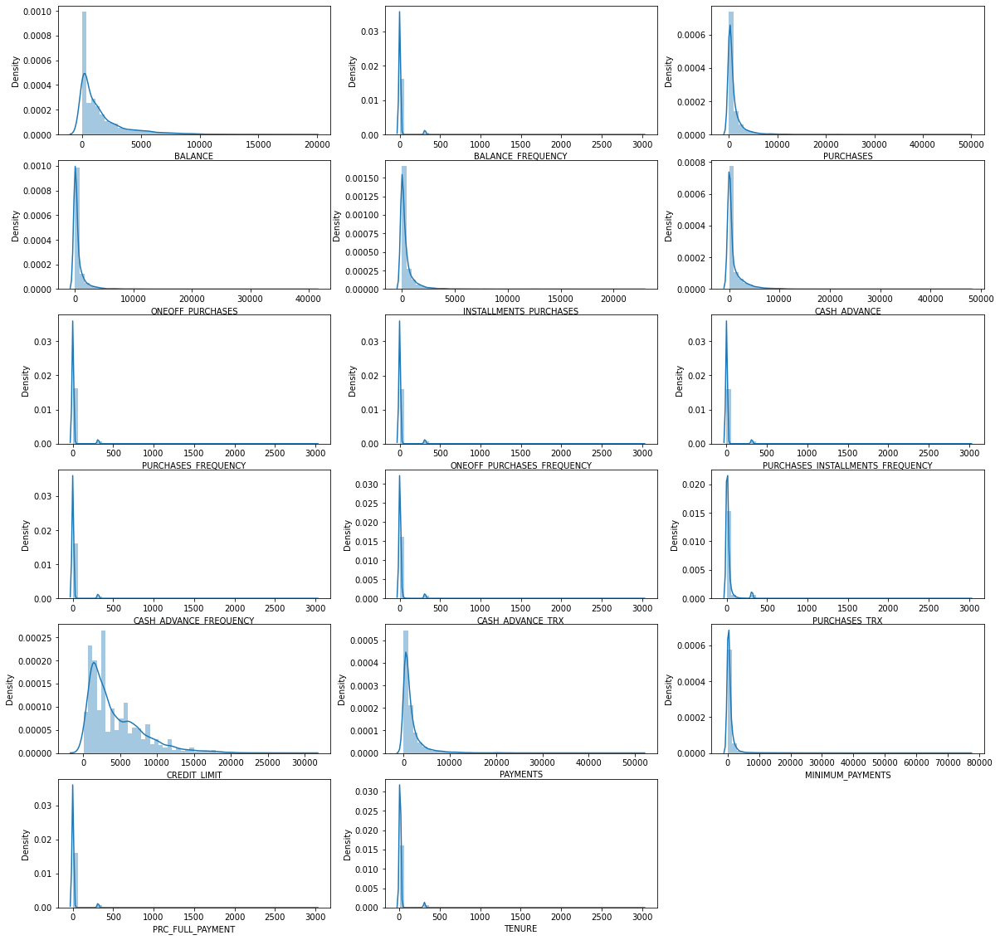

In [116]:
plt.figure(figsize=(20,20))
for i,var in enumerate(df.columns,1):  
    plt.subplot(6,3,i)
    sns.distplot(df[var])

### Boxplot plots

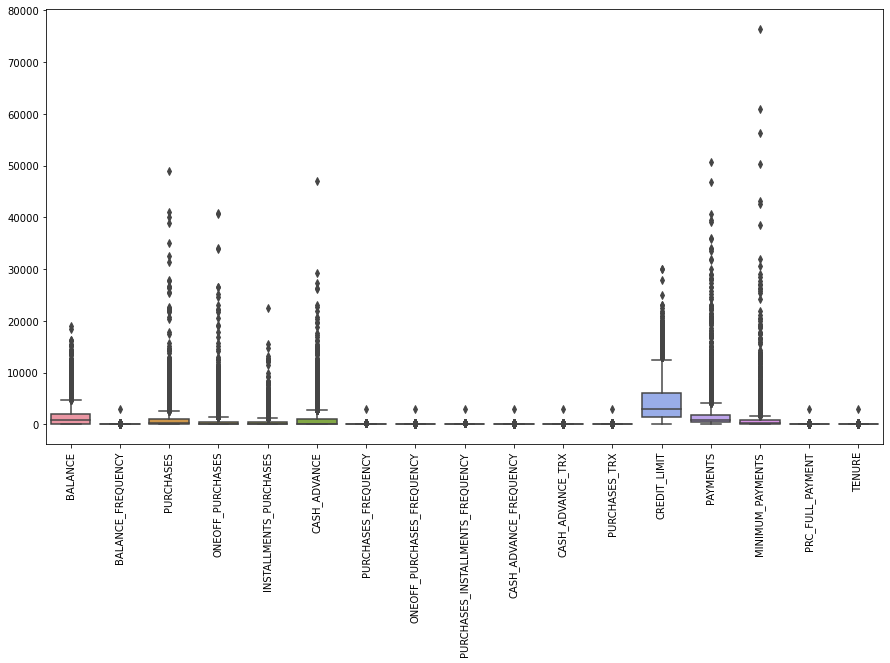

In [117]:
plt.figure(figsize=(15,8))
ax=sns.boxplot(data=df)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
plt.show()

Based on Distribution plots and boxplot it is observed that there are many outliers in most of the features.  
Outlier observations are identified using Zscore.    
Only those observations which has z values less than 3 are retained.

### Outlier treatment using Zscore

In [118]:
from scipy.stats import zscore
z=np.abs(zscore(df))
dfn=df[(z<3).all(axis=1)]
dfn.shape

(7904, 17)

In [119]:
dfn

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0.0,2.0,1000.0,201.802084,139.509787,0.000000,12.0
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4.0,0.0,7000.0,4103.032597,1072.340217,0.222222,12.0
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0.0,12.0,7500.0,622.066742,627.284787,0.000000,12.0
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0.0,1.0,1200.0,678.334763,244.791237,0.000000,12.0
5,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0.0,8.0,1800.0,1400.057770,2407.246035,0.000000,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8943,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0.0,1.0,500.0,58.644883,43.473717,0.000000,6.0
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0.0,6.0,1000.0,325.594462,48.886365,0.500000,6.0
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0.0,5.0,1000.0,81.270775,82.418369,0.250000,6.0
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2.0,0.0,500.0,52.549959,55.755628,0.250000,6.0


### Heatmap of feature correlations

<AxesSubplot:>

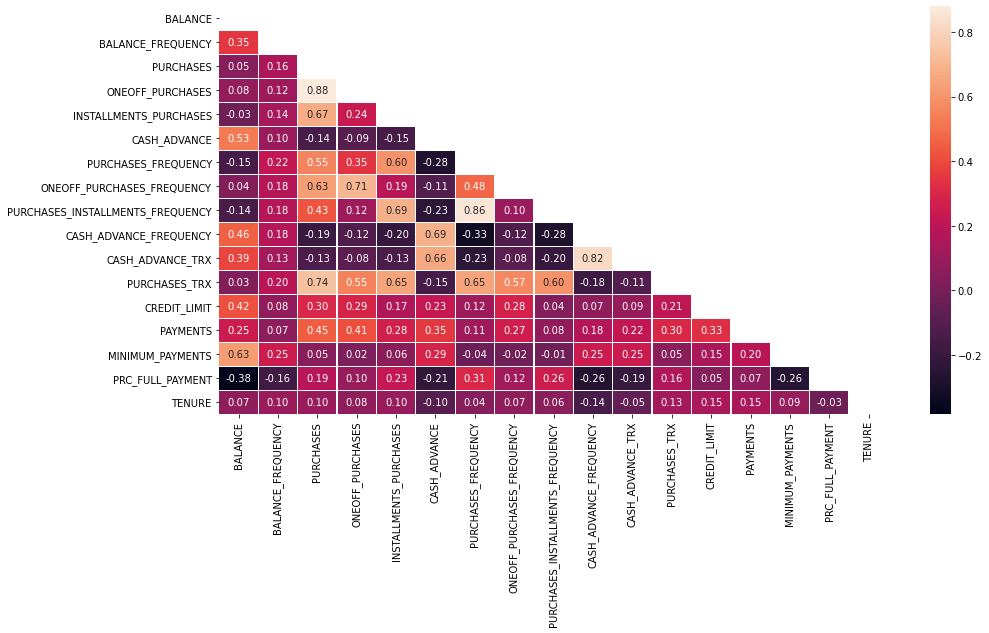

In [124]:
plt.figure(figsize=(15,7.5))
sns.heatmap(dfn.corr(),linewidths=0.3,annot=True,fmt='0.2F',mask=np.triu(dfn.corr()))

### Standardization and Normalization

In [132]:
from sklearn.preprocessing import StandardScaler,normalize
scaler=StandardScaler()
dfS=scaler.fit_transform(dfn)
dfN=normalize(dfS)
dfN=pd.DataFrame(dfN,columns=dfn.columns)
dfN.describe().T

,count,mean,std,min,25%,50%,75%,max
BALANCE,7904.0,-0.027116,0.242477,-0.460991,-0.207111,-0.090417,0.096279,0.807910
BALANCE_FREQUENCY,7904.0,0.014869,0.272944,-0.882965,0.011161,0.120147,0.185365,0.422614
PURCHASES,7904.0,-0.043523,0.208121,-0.363973,-0.196858,-0.109726,0.074221,0.640431
ONEOFF_PURCHASES,7904.0,-0.036002,0.208260,-0.370167,-0.176678,-0.115747,0.030326,0.758931
INSTALLMENTS_PURCHASES,7904.0,-0.032839,0.226488,-0.362865,-0.193887,-0.112747,0.067333,0.825142
CASH_ADVANCE,7904.0,-0.034502,0.227291,-0.376506,-0.185065,-0.123911,0.056779,0.872549
PURCHASES_FREQUENCY,7904.0,-0.021084,0.291686,-0.519996,-0.279247,0.006572,0.243503,0.562987
ONEOFF_PURCHASES_FREQUENCY,7904.0,-0.029277,0.251967,-0.442623,-0.206321,-0.129000,0.083498,0.794532
PURCHASES_INSTALLMENTS_FREQUENCY,7904.0,-0.016741,0.292333,-0.519223,-0.265625,-0.115325,0.235878,0.676509
CASH_ADVANCE_FREQUENCY,7904.0,-0.027671,0.245628,-0.449296,-0.206108,-0.110081,0.098530,0.809978


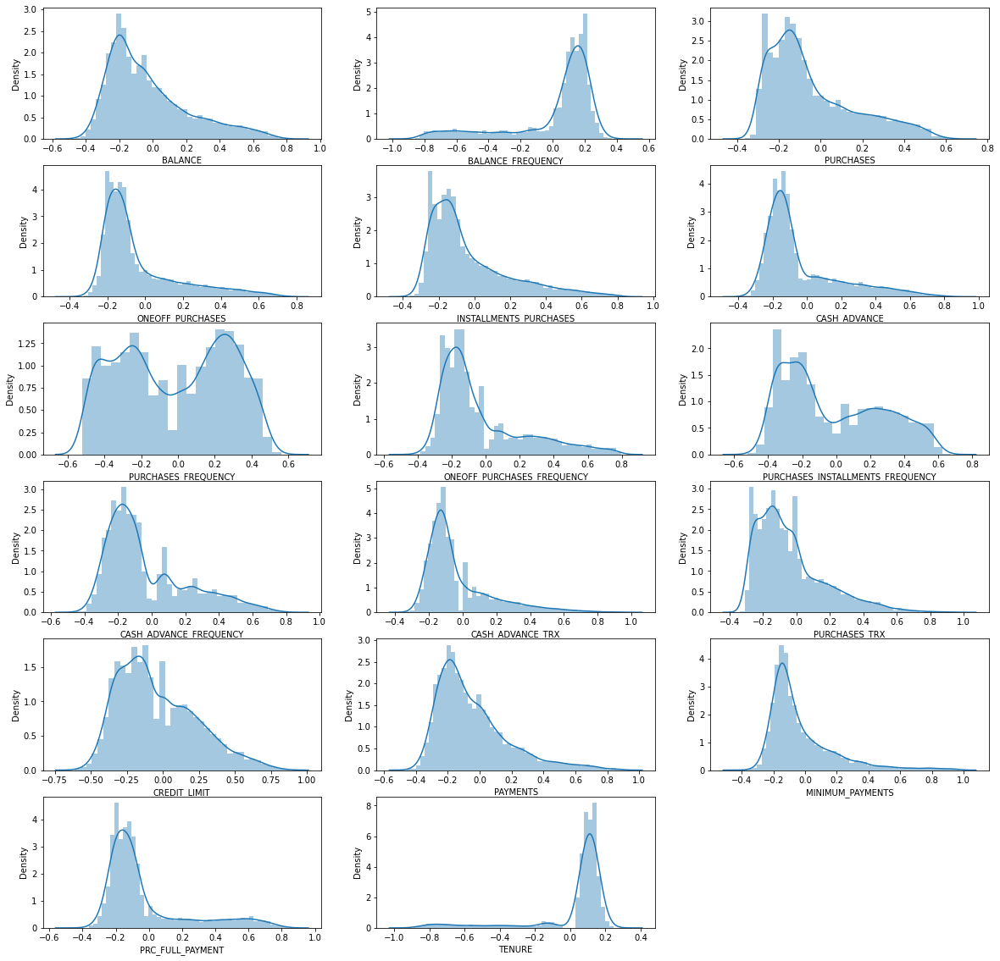

In [139]:
plt.figure(figsize=(20,20))
for i,var in enumerate(dfN.columns,1):  
    plt.subplot(6,3,i)
    sns.distplot(dfN[var])

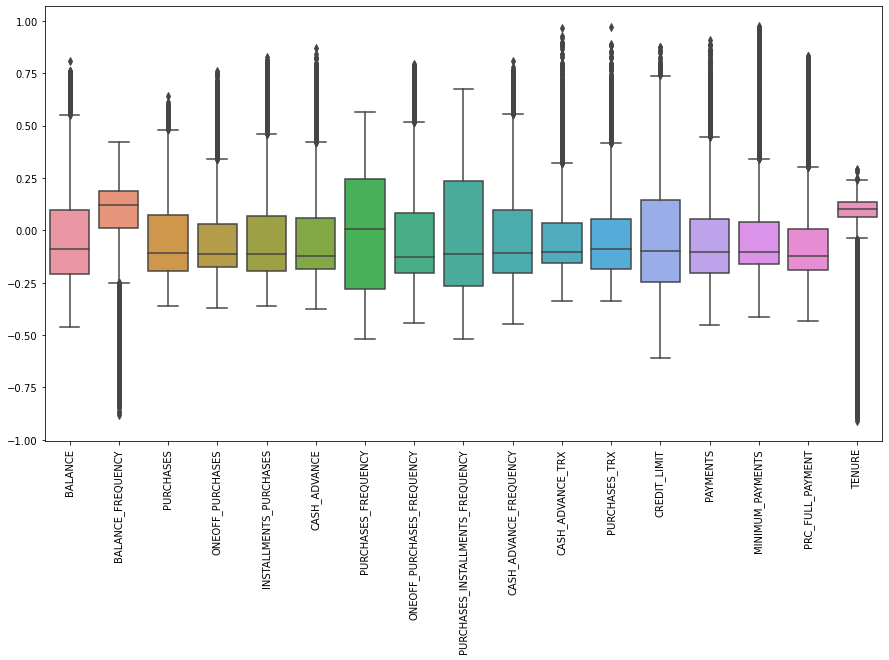

In [138]:
plt.figure(figsize=(15,8))
ax=sns.boxplot(data=dfN)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
plt.show()

## Model Building - KMeans Clustering 

### Selecting optimal number of clusters using Elbow and Silhouette Method

[109010.69631495792, 92799.05004439758, 82629.99330981425, 76346.07443509842, 71504.22801934149, 66943.64567571205, 63942.424414055655, 61242.81256545945]


Text(0, 0.5, 'Silhoette score')

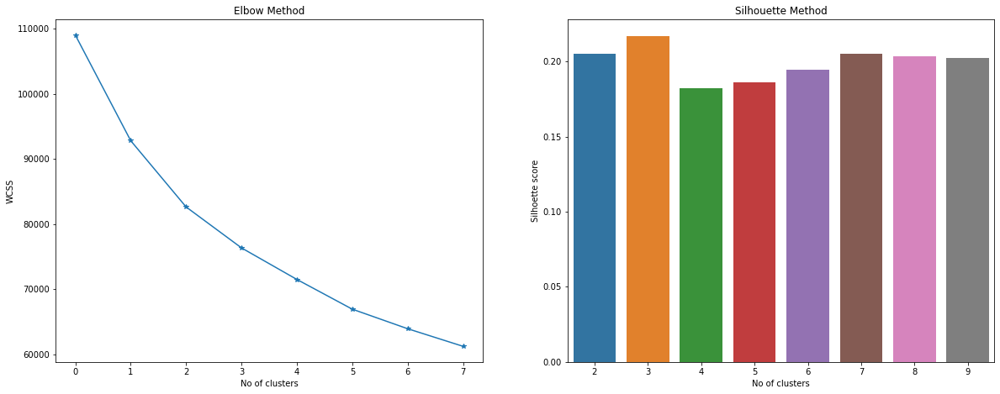

In [243]:
plt.figure(figsize=(20,7.5))
ax1=plt.subplot(1,2,1)
ax2=plt.subplot(1,2,2)

#Elbow Method
from sklearn.cluster import KMeans
cost=[]
for i in range(2,10):
    kmeans=KMeans(random_state=13,n_clusters=i)
    kmeans.fit(dfS)
    cost.append(kmeans.inertia_)
print (cost)
ax1.plot(cost,'-*')
ax1.set_title('Elbow Method')
ax1.set_xlabel('No of clusters')
ax1.set_ylabel('WCSS')

#Silhouette Method
from sklearn.metrics import silhouette_score
score=[]
for i in range(2,10):
    score.append(silhouette_score(dfS,KMeans(i).fit_predict(dfS)))
k=list(np.arange(2,10))
sns.barplot(k,score)
ax2.set_title('Silhouette Method')
ax2.set_xlabel('No of clusters')
ax2.set_ylabel('Silhoette score')

***
Optimal number of clusters could be selected using,   
ELbow method where sudden reduction in Within Cluster Sum of Squares (Elbow point).   
Silhouette method where silhoette score is maximum.   
In this case optimal number of clusters is 3.   
***

### KMeans Clustering model

In [187]:
kmeans=KMeans(random_state=13,n_clusters=3)
kmeans.fit(dfS)
kmeans.labels_

array([1, 0, 2, ..., 1, 1, 1])

In [189]:
kmeans.cluster_centers_.shape

(3, 17)

### Cluster centers.

In [194]:
cluster_centers=pd.DataFrame(kmeans.cluster_centers_,columns=df.columns)
cluster_centers

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,1.079487,0.311773,-0.470124,-0.330593,-0.445972,1.346520,-0.702030,-0.346276,-0.596188,1.334477,1.169131,-0.468146,0.394118,0.411315,0.730175,-0.435516,-0.108211
1,-0.423254,-0.234951,-0.340504,-0.300298,-0.227840,-0.392067,-0.082652,-0.275326,-0.049570,-0.369621,-0.335613,-0.279634,-0.353004,-0.392758,-0.288779,0.047966,-0.044634
2,0.093326,0.382475,1.614873,1.327542,1.231706,-0.312230,1.068284,1.266811,0.842177,-0.369179,-0.286248,1.420592,0.660135,0.765751,0.070966,0.349687,0.265272


### Inverse transform to show actual feature values

In [196]:
pd.DataFrame(scaler.inverse_transform(cluster_centers),columns=df.columns)

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,2958.331425,0.956181,264.824533,168.679790,96.165000,2516.452115,0.208693,0.093788,0.125876,0.381424,9.574679,4.285298,5135.047382,1933.442023,1163.680033,0.029209,11.373979
1,647.433870,0.840633,402.132619,193.119064,209.420781,227.419995,0.455221,0.114292,0.341039,0.057802,0.966596,7.673617,2939.547894,753.398586,355.095997,0.171123,11.458723
2,1441.824400,0.971124,2473.496423,1506.301678,967.227631,332.532783,0.913321,0.559963,0.692054,0.057886,1.248993,38.233557,5916.766321,2453.605611,640.569035,0.259685,11.871812


***
- Clusters are formed based on the features value differentiation.      
- BALANCE, PAYMENTS and MINIMUM_PAYMENTS feature could easily differentiate cluster 1 from the rest as they do minimum payments and have minimum balances.   
- INSTALLMENTS_PURCHASES, CASH_ADVANCE, CASH_ADVANCE_FREQUENCY, CASH_ADVANCE_TRX and MINIMUM_PAYMENTS feature differentiate cluster 0 from rest as these people does less installment purchases and does more cash advance.
- PURCHASES, ONEOFF_PURCHASES, INSTALLMENTS_PURCHASES, PURCHASES_TRX features could differentiate cluster 2 from rest as they are dominating in these.

### Dataframe with clusters assigned to observations

In [203]:
dfn_cl=pd.concat([dfn.reset_index(),pd.DataFrame({'Clusters':kmeans.labels_})],axis=1)
dfn_cl.head()

,index,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Clusters
0,0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.00,0.0,2.0,1000.0,201.802084,139.509787,0.000000,12.0,1
1,1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.25,4.0,0.0,7000.0,4103.032597,1072.340217,0.222222,12.0,0
2,2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.00,0.0,12.0,7500.0,622.066742,627.284787,0.000000,12.0,2
3,4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.00,0.0,1.0,1200.0,678.334763,244.791237,0.000000,12.0,1
4,5,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.00,0.0,8.0,1800.0,1400.057770,2407.246035,0.000000,12.0,1


<AxesSubplot:xlabel='BALANCE', ylabel='BALANCE_FREQUENCY'>

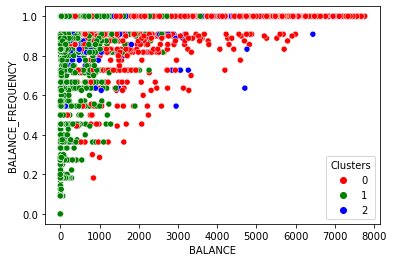

In [213]:
sns.scatterplot(x='BALANCE',y='BALANCE_FREQUENCY',hue='Clusters',data=dfn_cl,palette=['r','g','b'])

### Pairplot with clusters on hue

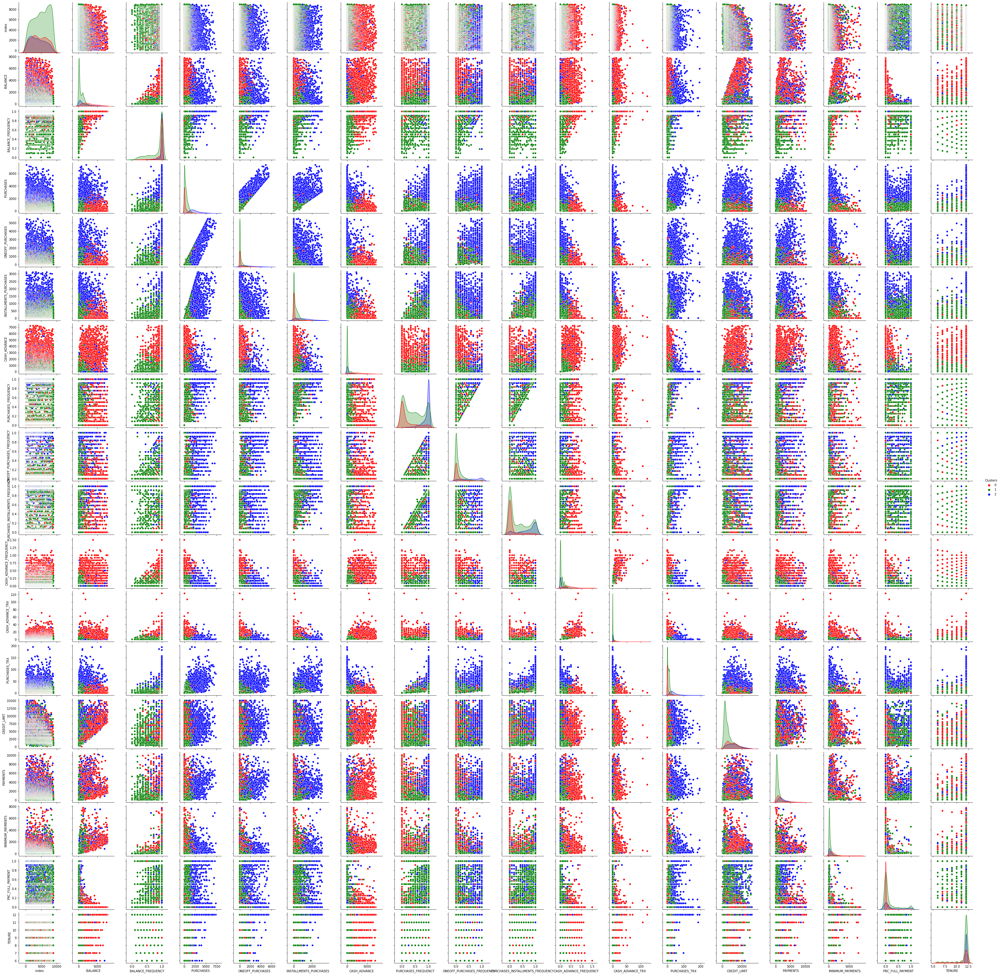

In [216]:
sns.pairplot(hue='Clusters',data=dfn_cl,palette=['r','g','b'])

### Number of observations on each clusters

In [217]:
pd.crosstab(index=dfn_cl.Clusters,columns='Count')

col_0,Count
Clusters,
0,1717
1,4699
2,1488


## Principal Component Analysis

***
Principal Component Analysis is dimensionality reduction technique.    
Using which number of features could be reduced.   
Every features getting out of PCA will be orthogonal to each other and are not correlated to each other.   
Model complexity will be reduced and over fitting could be handled.   
***

In [230]:
from sklearn.decomposition import PCA
pca=PCA(n_components=5)
df_pca=pca.fit_transform(dfS)
df_pca

array([[-1.45612856, -1.88906501,  0.245084  , -0.64093809, -0.09936484],
       [-2.36055781,  3.24566393,  0.48683167,  0.8021876 ,  2.03178746],
       [ 1.21980782,  0.46151027,  1.47162828, -1.74288546, -1.01863008],
       ...,
       [-0.45344789, -2.38288211, -1.06929183,  1.92816753, -2.30071941],
       [-2.28034514, -1.87100478,  0.30542157,  1.93130288, -2.42543208],
       [-0.04854196, -0.64227487,  1.45060583,  2.0479607 , -3.76957356]])

### Explained variance by each PCA components

In [231]:
print(pca.explained_variance_)
print(pca.explained_variance_ratio_)
print(sum(pca.explained_variance_ratio_))

[4.8625683  3.51221071 1.57734672 1.35233256 1.09485837]
[0.28599724 0.20657449 0.09277336 0.07953891 0.06439529]
0.7292792892929026


With number of features generated total 73% of data details are covered.

In [237]:
df_pca=pd.DataFrame(df_pca,columns=['PCA1','PCA2','PCA3','PCA4','PCA5'])
df_pca

,PCA1,PCA2,PCA3,PCA4,PCA5
0,-1.456129,-1.889065,0.245084,-0.640938,-0.099365
1,-2.360558,3.245664,0.486832,0.802188,2.031787
2,1.219808,0.461510,1.471628,-1.742885,-1.018630
3,-1.532873,-1.306494,0.319208,-1.109626,-0.370065
4,0.874061,0.161649,-2.103218,-1.448275,0.473315
...,...,...,...,...,...
7899,-1.945228,-2.450219,0.908122,1.650393,-2.160105
7900,0.232025,-2.330031,-1.594558,2.217508,-2.278530
7901,-0.453448,-2.382882,-1.069292,1.928168,-2.300719
7902,-2.280345,-1.871005,0.305422,1.931303,-2.425432


### KMeans CLustering model

In [233]:
kmeans=KMeans(n_clusters=3)
kmeans.fit(df_pca)
kmeans.labels_

array([1, 0, 2, ..., 1, 1, 1])

### Assigning cluster labels to the observations

In [239]:
df_pca=pd.concat([df_pca,pd.DataFrame(kmeans.labels_,columns=['Cluster'])],axis=1)
df_pca.head()

,PCA1,PCA2,PCA3,PCA4,PCA5,Cluster
0,-1.456129,-1.889065,0.245084,-0.640938,-0.099365,1
1,-2.360558,3.245664,0.486832,0.802188,2.031787,0
2,1.219808,0.461510,1.471628,-1.742885,-1.018630,2
3,-1.532873,-1.306494,0.319208,-1.109626,-0.370065,1
4,0.874061,0.161649,-2.103218,-1.448275,0.473315,1


### Pairplot of PCA components with clusters on hue

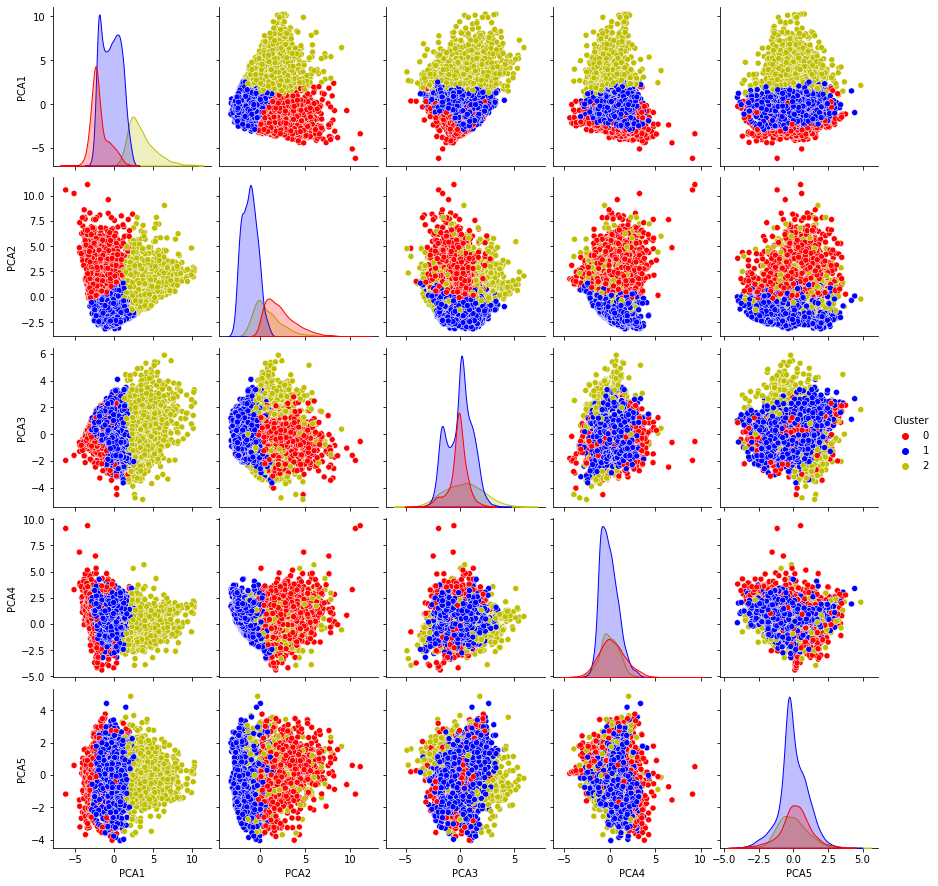

In [241]:
sns.pairplot(data=df_pca,hue='Cluster',palette=['r','b','y'])

## Inference

***
From above solution,   
- whole dataset is been clustered into 3 different clusters.   
- Optimal number of clusters are defined by using both Elbow and silhouette methods.   
- Principal component analysis also done and observed selected number of cluster is optimal.   
- Pairplots are plotted in order to visualize the different clusters in different dimensions.   
***